<a href="https://colab.research.google.com/github/txnaves/hello-world/blob/master/MVP_ML%26Analytics_PUCRJ_ThiagoXN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## PREVISÃO DE PREÇO DE CASAS EM MELBOURNE/AU
MVP Machine Learning & Analytics - Abril/24 \
Aluno: Thiago Ximenes Naves

### Introdução

**Definição do problema**

Neste projeto, o foco está em explorar os preços das casas na região de Melbourne, Austrália, visando compreender os fatores que influenciam esses preços e desenvolver um modelo preditivo preciso. O problema central envolve a previsão dos preços das casas com base em atributos como localização, tamanho da propriedade, número de quartos, entre outros. Além disso, o projeto busca identificar padrões de mercado e fornecer insights valiosos para compradores, vendedores e agentes imobiliários, auxiliando-os a tomar decisões informadas no mercado imobiliário de Melbourne.

**Premissas**
- o tamanho da propriedade influencia diretamente no seu preço
- a localização do imóvel é importante para se entender seu valor de mercado

**Hipóteses**
- existe correlação entre diferentes atributos das propriedades, como tamanho, localização e características específicas, e que essa correlação pode influenciar os preços das casas de maneira complexa.
- a localização é um dos principais determinantes dos preços das casas, com áreas mais valorizadas tendendo a ter preços mais altos.

In [6]:
# Configuração para não exibir os warnings
import warnings
warnings.filterwarnings("ignore")

# Imports necessários
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split # para particionar em bases de treino e teste (holdout)
from sklearn.model_selection import KFold # para preparar os folds da validação cruzada
from sklearn.model_selection import cross_val_score # para executar a validação cruzada
from sklearn.metrics import mean_squared_error # métrica de avaliação MSE
from sklearn.linear_model import LinearRegression # algoritmo Regressão Linear
from sklearn.linear_model import Ridge # algoritmo Regularização Ridge
from sklearn.linear_model import Lasso # algoritmo Regularização Lasso
from sklearn.neighbors import KNeighborsRegressor # algoritmo KNN
from sklearn.tree import DecisionTreeRegressor # algoritmo Árvore de Regressão
from sklearn.svm import SVR # algoritmo SVM
from sklearn.metrics import r2_score

! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     - 17.8 MB 23.9 MB/s 0:00:01
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 3.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 293.3/293.3 kB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 13.1 MB/s eta 0:00:00
  Created wheel for ydata-profiling: filename=ydata_profiling-0.0.dev0-py2.py3-none-any.whl size=357942 sha256=7679ad5e0be6bd2cdbe32e9734e8de12fa190c180bd48440a9f7f03769041ae5
  Stored in directory: /tmp/pip-ephem-wheel-cache-55w5gmlw/wheels/07/29/61/f533cc7cbd0a97efb2d1b94d3254a3e859a949367ba842577b
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=b38ae90c99f0b94762811184a18fc11723ff040fe579121162bd77c8dee3efd1
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098

In [8]:
import pandas_profiling
from pandas_profiling import ProfileReport

In [7]:
data = pd.read_csv('/content/melb_data.csv')

**Descrição do dataset:**

In [9]:
profile = ProfileReport(data)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Ajustes do dataset com base na análise descritiva dos dados utilizando o relatório acima**

In [10]:
# Retirar colunas com alta cardinalidade
data = data.drop(['Suburb','Address','SellerG','Date'], axis=1)

# Retirar colunas com mais de 20% de valores nulos
data = data.drop(['BuildingArea','YearBuilt'], axis=1)

# Retirar colunas que não influenciam no modelo
data = data.drop(['Type','Method','CouncilArea','Regionname','Distance','Lattitude','Longtitude','Propertycount'], axis=1)

data.head()

,Rooms,Price,Postcode,Bedroom2,Bathroom,Car,Landsize
0,2,1480000.0,3067.0,2.0,1.0,1.0,202.0
1,2,1035000.0,3067.0,2.0,1.0,0.0,156.0
2,3,1465000.0,3067.0,3.0,2.0,0.0,134.0
3,3,850000.0,3067.0,3.0,2.0,1.0,94.0
4,4,1600000.0,3067.0,3.0,1.0,2.0,120.0


In [11]:
data = data.dropna(axis=0)

In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 13518 entries, 0 to 13579
Data columns (total 7 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Rooms     13518 non-null  int64  
 1   Price     13518 non-null  float64
 2   Postcode  13518 non-null  float64
 3   Bedroom2  13518 non-null  float64
 4   Bathroom  13518 non-null  float64
 5   Car       13518 non-null  float64
 6   Landsize  13518 non-null  float64
dtypes: float64(6), int64(1)
memory usage: 844.9 KB


### Criando o modelo de ML

**Separar entre variável que quero prever (Y) e as colunas que irei usar na previsão (X)**

In [13]:
Y = data.Price
X = data.drop('Price',axis=1)

**Agora separarei a base entre treino e teste**

In [14]:
x_treino, x_teste, y_treino, y_teste = train_test_split(X,Y)

**Seleção do modelo a ser utilizado**

##### Regressão Linear

In [22]:
modelo_regressao = LinearRegression()

# Realizando o fit do modelo
modelo_regressao.fit(x_treino,y_treino)

# Usando modelo para prever dados de teste
y_regressao = modelo_regressao.predict(x_teste)

**Avaliando os erros do modelo de Regressão Linear**

In [24]:
erro_quadratico_regressao = mean_squared_error(y_teste,y_regressao)
print(erro_quadratico_regressao)

307787864098.5203


In [25]:
r2_regressao = r2_score(y_teste,y_regressao)
print(r2_regressao)

0.3066697960508793


##### Árvore de Decisão

In [26]:
modelo_arvore = DecisionTreeRegressor()

# Realizando o fit do modelo
modelo_arvore.fit(x_treino,y_treino)

# Usando modelo para prever dados de teste
y_arvore_decisao = modelo_arvore.predict(x_teste)

# Criando os folds para a validação cruzada
num_particoes = 10 # número de folds da validação cruzada
kfold = KFold(n_splits=num_particoes, shuffle=True, random_state=7) # faz o particionamento em 10 folds

**Avaliando os erros do modelo de Árvore de Decisão**

In [27]:
erro_quadratico_arvore_decisao = mean_squared_error(y_teste,y_arvore_decisao)
print(erro_quadratico_arvore_decisao)

242458288391.54138


In [28]:
r2_arvore_decisao = r2_score(y_teste,y_arvore_decisao)
print(r2_arvore_decisao)

0.45383273953305214


### Comparação entre diferentes modelos

LR: MSE 281940107186.07 (31850282217.08) - RMSE 530980.33
Ridge: MSE 281938451193.38 (31847922030.58) - RMSE 530978.77
Lasso: MSE 281939872471.57 (31850131116.52) - RMSE 530980.11
KNN: MSE 247690279812.57 (19370626154.14) - RMSE 497684.92
CART: MSE 204337524547.20 (24598384770.00) - RMSE 452037.08
SVM: MSE 426830202727.77 (42016987163.90) - RMSE 653322.43


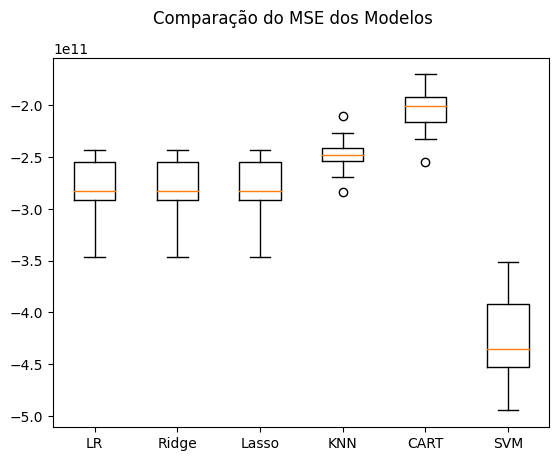

In [29]:
# Definindo uma seed global para esta célula de código
np.random.seed(7)

# Listas para armazenar os modelos, os resultados e os nomes dos modelos
models = []
results = []
names = []

# Preparando os modelos e adicionando-os em uma lista
models.append(('LR', LinearRegression()))
models.append(('Ridge', Ridge()))
models.append(('Lasso', Lasso()))
models.append(('KNN', KNeighborsRegressor()))
models.append(('CART', DecisionTreeRegressor()))
models.append(('SVM', SVR()))

# Avaliando um modelo por vez
for name, model in models:
  cv_results = cross_val_score(model, x_treino, y_treino, cv=kfold, scoring='neg_mean_squared_error')
  results.append(cv_results)
  names.append(name)
  # imprime MSE, desvio padrão do MSE e RMSE dos 10 resultados da validação cruzada
  msg = "%s: MSE %0.2f (%0.2f) - RMSE %0.2f" % (name, abs(cv_results.mean()), cv_results.std(), np.sqrt(abs(cv_results.mean())))
  print(msg)

# Boxplot de comparação dos modelos
fig = plt.figure()
fig.suptitle('Comparação do MSE dos Modelos')
ax = fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()

In [30]:
# Criando um modelo com todo o conjunto de treino
model = LinearRegression()
model.fit(x_treino, y_treino)

# Fazendo as predições com o conjunto de teste
predictions = model.predict(x_teste)

# Estimando o MSE e o RMSE no conjunto de teste
mse = mean_squared_error(y_teste, predictions)
print("MSE %0.2f" % mse)
print("RMSE %0.2f" % np.sqrt(abs(mse)))

MSE 307787864098.52
RMSE 554786.32
